In [16]:
# %pip install -U sentence-transformers
# %pip install plotly
from sentence_transformers import SentenceTransformer

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score
from sklearn.ensemble import IsolationForest

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.pyplot import xticks
import nltk
from nltk.corpus import stopwords

## Data

In [2]:
df = pd.read_csv("../data/preprocessed_data.csv")
df.head()
print(len(df))

2985


In [3]:
df = df.drop_duplicates(subset=['speeches']).reset_index(drop=True)

In [4]:
len(df)

1926

## Sentence Embedding

In [5]:
sentence_model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

speeches = df["speeches"]
X = sentence_model.encode(speeches)

## Dimensional Reduction

In [6]:
dim = 2

# reductor = PCA(dim)
reductor = TSNE(dim)

X_emb = reductor.fit_transform(X)
df[[f"x{i}" for i in range(dim)]] = X_emb
df.head()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,44.797115,-4.434467
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,52.816654,-3.512827
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,45.276085,-1.440651
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,46.487709,-2.405825
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,36.366150,-17.580130


## Clustering

In [7]:
ks = []
calinski = []
inertias = []

for k in range(10, 150):
    model = KMeans(k)
    clusters = model.fit_predict(X_emb)

    ks.append(k)
    inertias.append(model.inertia_)
    calinski.append(calinski_harabasz_score(X_emb, clusters))

best_i = np.argmax(calinski)
best_k = ks[best_i]

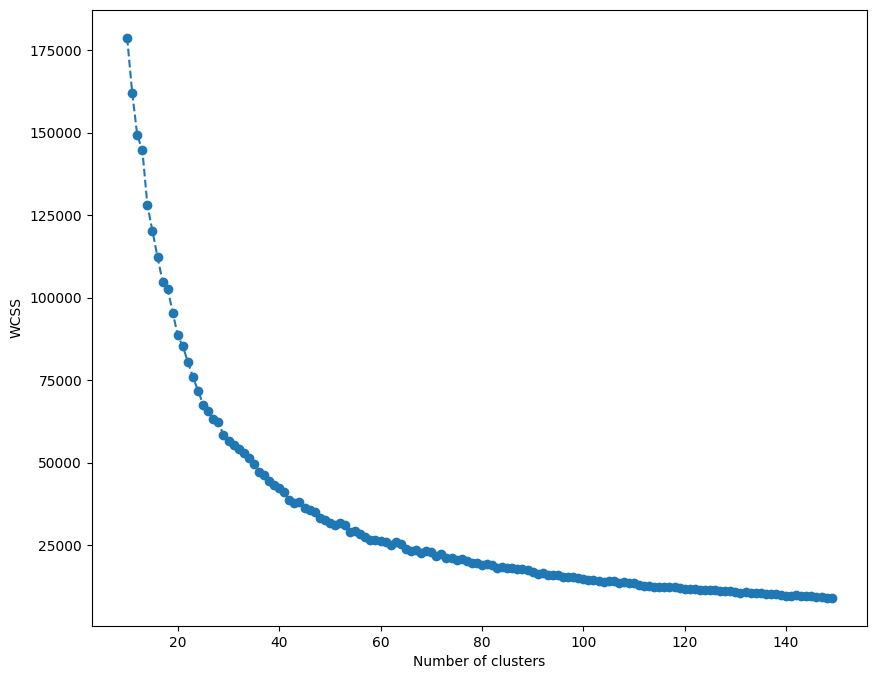

In [89]:
plt.figure(figsize=(10, 8))
plt.plot(ks,inertias, marker='o', linestyle='--', )

plt.xlabel("Number of clusters")
plt.ylabel("WCSS")

plt.show()

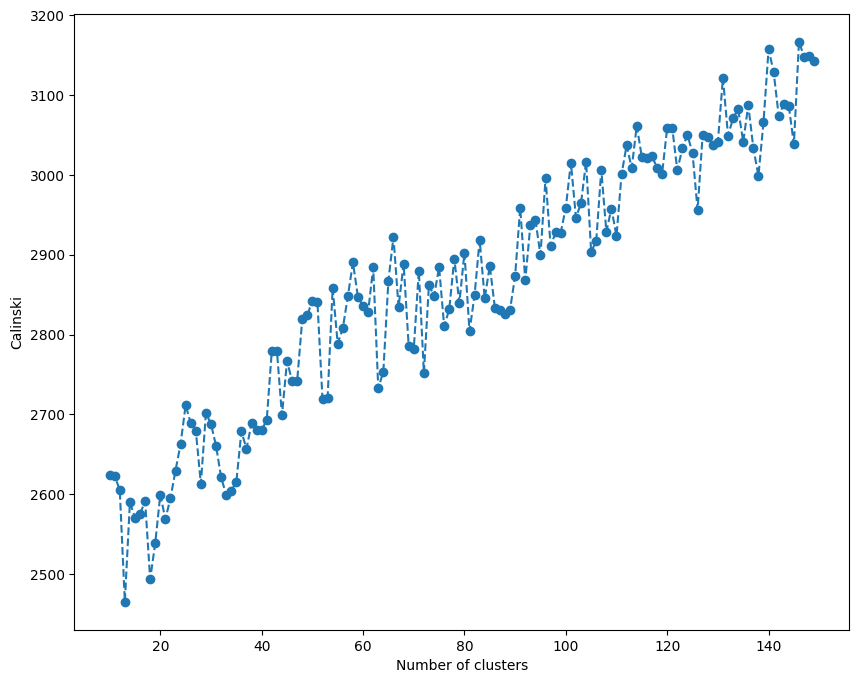

In [88]:
plt.figure(figsize=(10, 8))
plt.plot(ks, calinski, marker='o', linestyle='--')
plt.xlabel("Number of clusters")
plt.ylabel("Calinski")

plt.show()

In [10]:
selected_k = 42

model = KMeans(selected_k)
clusters = model.fit_predict(X_emb)

df["cluster"] = clusters
df.head()

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,44.797115,-4.434467,34
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,52.816654,-3.512827,29
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,45.276085,-1.440651,34
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,46.487709,-2.405825,34
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,36.366150,-17.580130,10


In [18]:
stopwords_list = stopwords.words('english')

In [23]:
import plotly.graph_objects as go

colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'white', 'orange', 'purple', 'pink', 'gray', 'brown']
color_dict = dict(zip(range(len(colors)), colors))

fig = go.Figure()
for cluster in range(selected_k):
    cluster_data = df[df['cluster'] == cluster]
    cluster_data['speeches_cleaned'] = cluster_data['speeches'].apply(lambda speech: ' '.join([word for word in str(speech).split(' ') if word not in stopwords_list]))
    
    fig.add_trace(go.Scatter(
        x=cluster_data['x0'],
        y=cluster_data['x1'],
        mode='markers',
        marker=dict(color=color_dict[cluster % len(colors)]),
        name=f'Cluster {cluster}',
        text=cluster_data['speeches_cleaned']
    ))

fig.update_layout(
    title='Gráfico de dispersión con colores por cluster',
)

fig.show()

/var/folders/b5/zsgbxty17rn21slqnmj3c2t00000gn/T/ipykernel_91810/2101642766.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/b5/zsgbxty17rn21slqnmj3c2t00000gn/T/ipykernel_91810/2101642766.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/b5/zsgbxty17rn21slqnmj3c2t00000gn/T/ipykernel_91810/2101642766.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [151]:
interesting_clusters = {
    5: 'family',
    10: 'agriculture',
    14: 'melilla',
    20: 'economy',
    30: 'russia'
}

In [173]:
interesting_clusters_df = df[df.cluster.isin(interesting_clusters.keys())]

In [174]:
interesting_clusters_df = interesting_clusters_df[['cluster', 'county', 'speeches']].groupby(['cluster', 'county']).agg("count").reset_index()

In [175]:
interesting_clusters_df['cluster'] = interesting_clusters_df.cluster.map(interesting_clusters)

In [176]:
interesting_clusters_df

,cluster,county,speeches
0,family,ES,33
1,family,IT,20
2,agriculture,ES,18
3,agriculture,IT,25
4,melilla,ES,32
5,economy,ES,17
6,economy,IT,6
7,russia,ES,8
8,russia,IT,52


In [178]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [182]:
fig = make_subplots(rows=1, cols=1)

interesting_clusters_df_it = interesting_clusters_df[interesting_clusters_df.county == 'IT']
interesting_clusters_df_es = interesting_clusters_df[interesting_clusters_df.county == 'ES']

fig.add_trace(
    go.Bar(x=interesting_clusters_df_it.cluster, y=interesting_clusters_df_it.speeches, name='IT'),
    row=1, col=1
)
fig.add_trace(
    go.Bar(x=interesting_clusters_df_es.cluster, y=interesting_clusters_df_es.speeches, name='ES'),
    row=1, col=1
)

fig.update_layout(height=600, width=600)
fig.show()

In [84]:
from collections import Counter
pd.set_option('display.max_columns', 500)

In [135]:
stopwords_list += [
    'senator',
    'governemnt',
    'mr',
    'ladies',
    'gentlemen',
    "'s",
    "n't",
    "b",
    "'m",
    'mr.',
    'president',
    'n.',
    '',
    "'re",
    'also',
    'would',
    'can'
]

In [136]:
df['speeches_cleaned'] = df['speeches'].str.lower()
df['speeches_cleaned'] = df['speeches_cleaned'].apply(lambda speech: ' '.join([word for word in str(speech).split(' ') if word not in stopwords_list]))
speeches_by_cluster = df[['speeches_cleaned','cluster']].groupby(['cluster']).agg(list).reset_index()
speeches_by_cluster['speeches_cleaned'] = speeches_by_cluster['speeches_cleaned'].map(lambda speeches: ' '.join([str(speech) for speech in speeches]))
speeches_by_cluster['top_10_words'] = speeches_by_cluster['speeches_cleaned'].map(
    lambda speeches: [x for x, _ in Counter(str(speech) for speech in speeches.split(' ')).most_common(10)]
)

In [137]:
cluster_nr = 0
cluster_top_words = dict()

for i in speeches_by_cluster['top_10_words']:
    cluster_top_words[f'{cluster_nr=}'] = i
    cluster_nr += 1

In [148]:
df_cluster_words = pd.DataFrame(cluster_top_words)
df_cluster_words.T.to_csv('../out/top_10_words_per_cluster.csv')

In [149]:
df_cluster_words

,cluster_nr=0,cluster_nr=1,cluster_nr=2,cluster_nr=3,cluster_nr=4,cluster_nr=5,cluster_nr=6,cluster_nr=7,cluster_nr=8,cluster_nr=9,cluster_nr=10,cluster_nr=11,cluster_nr=12,cluster_nr=13,cluster_nr=14,cluster_nr=15,cluster_nr=16,cluster_nr=17,cluster_nr=18,cluster_nr=19,cluster_nr=20,cluster_nr=21,cluster_nr=22,cluster_nr=23,cluster_nr=24,cluster_nr=25,cluster_nr=26,cluster_nr=27,cluster_nr=28,cluster_nr=29,cluster_nr=30,cluster_nr=31,cluster_nr=32,cluster_nr=33,cluster_nr=34,cluster_nr=35,cluster_nr=36,cluster_nr=37,cluster_nr=38,cluster_nr=39,cluster_nr=40,cluster_nr=41
0,right,government,government,vote,minutes,law,vote,must,speak,sitting,water,amendment,thank,vote,one,government,law,question,government,article,government,health,spain,law,vote,debate,minutes,like,must,spain,must,us,vote,minister,energy,rapporteur,vote,psd,sitting,government,rapporteur,madrid
1,speak,health,spain,simultaneous,floor,women,government,work,right,representative,agriculture,amendments,done,amendment,government,italy,discussion,minutes,law,law,tax,government,government,spanish,proceed,senators,sitting,pnrr,energy,government,european,important,annex,one,spain,debate,followed,az,vote,even,law,law
2,enlisted,even,spaniards,followed,thank,minister,agenda,sport,registered,government,one,opinion,women,see,spain,european,time,right,spain,parliamentary,public,measure,us,people,law,call,read,thank,government,spaniards,us,law,followed,know,spaniards,call,senate,l,suspended,us,draft,public
3,de,measures,minister,senate,time,violence,amendment,great,enlisted,p.m.,government,commission,much,senate,melilla,us,vote,explain,know,sport,us,like,spaniards,government,trust,closed,debate,today,us,spanish,italy,animals,refer,us,government,report,simultaneous,sp,p.m.,measure,debate,government
4,declare,law,us,see,finish,us,article,today,declare,call,food,agenda,like,followed,us,even,decree,three,minister,vote,billion,national,spanish,public,amendment,motions,since,government,italy,minister,war,wild,simultaneous,going,us,speak,see,de,resumed,time,report,contracts
5,open,us,people,annex,de,children,amendments,us,open,suspended,us,l,house,annex,border,like,conference,colleagues,court,judiciary,years,us,much,us,government,ask,shall,cannot,minister,one,country,measure,ballot,thank,minister,general,annex,gasperi,suspend,vote,next,sector
6,general,masks,law,refer,colleagues,one,law,like,discussion,agenda,must,sp,,simultaneous,minister,brothers,p.m.,words,us,must,increase,italy,energy,spain,shall,rapporteur,secretary,question,country,people,ukraine,must,senate,like,spanish,resolution,refer,ask,a.m.,say,item,work
7,discussion,must,spanish,ballot,give,family,proceed,alpine,debate,suspend,farmers,psd,going,tabled,say,say,government,like,vox,constitution,debt,amendment,people,vox,amendments,give,comments,us,today,us,government,today,approves,government,one,closed,approves,vote,work,like,oral,us
8,mallegni,green,know,amendment,please,people,representative,group,general,resumed,agricultural,az,afghan,refer,spanish,majority,senate,voice,spanish,one,million,even,state,one,decree,order,approved,life,gas,know,russia,like,see,spaniards,party,agenda,amendment,maria,rule,parliament,call,time
9,asked,decree,public,approves,presidency,must,decree,one,gallone,ask,sector,government,say,ballot,said,vote,explanations,ask,one,even,year,public,going,health,text,opinion,a.m.,people,one,economic,today,government,call,much,today,distributed,tabled,romana,rules,must,deputies,one


In [139]:
df.to_csv("clusters.csv", index=False)

In [140]:
from wordcloud import WordCloud
from collections import Counter
from spacy.lang.en import English

In [141]:
def get_freqs(sentences):
    counter = Counter()
    nlp = English()
    tokenizer = nlp.tokenizer

    for sentence in sentences:
        try:
            for word in tokenizer(sentence):
                    counter[word.text] += 1
        except Exception as e:
            print(e)

    return counter

In [142]:
with open("../data/stopwordlist_en.txt", 'r') as f:
    stopwords = f.read().split("\n")

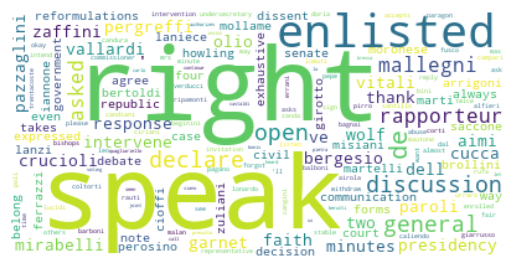

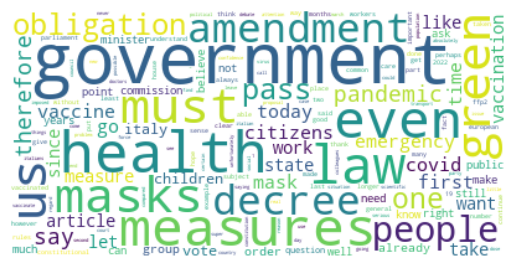

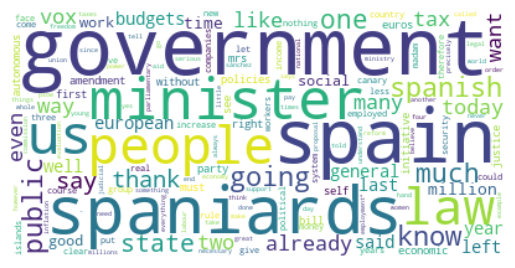

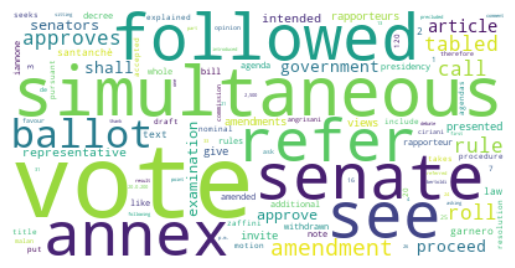

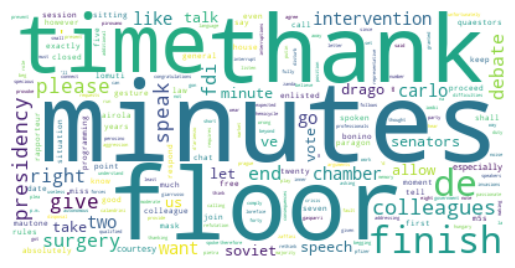

...

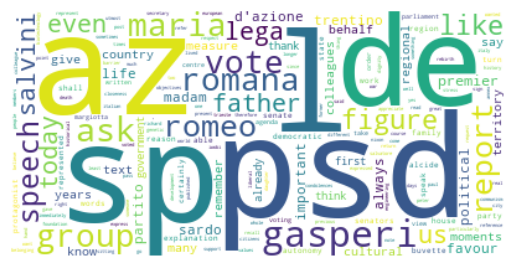

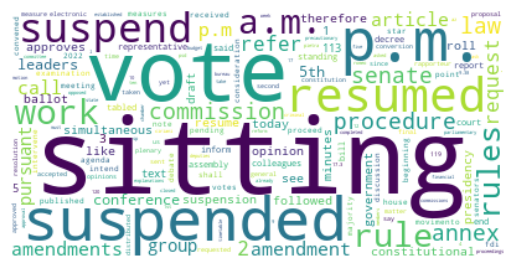

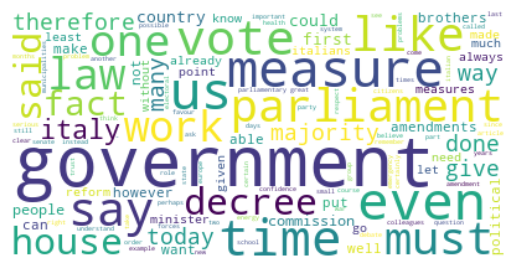

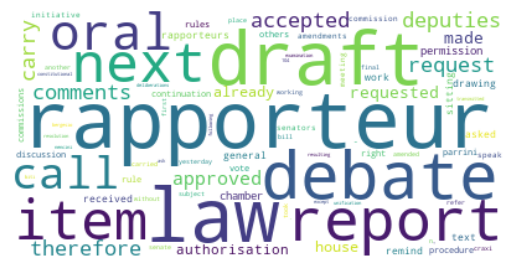

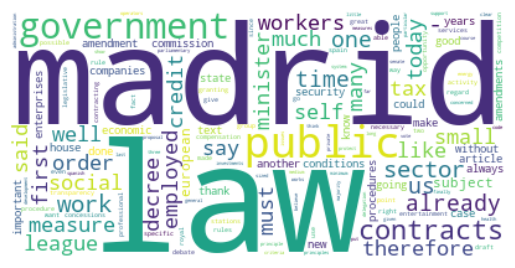

In [143]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]["speeches_cleaned"]
    freqs = get_freqs(cluster_i)
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(freqs)
    
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig(f"../out/cluster{i}.png")
    plt.show()

In [60]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]
    cluster_i.to_csv(f"../out/cluster{i}.csv", index=False)

In [61]:
df

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster,speeches_cleaned
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,44.797115,-4.434467,34,good afternoon ladies gentlemen mr echenique i...
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,52.816654,-3.512827,29,thank president good morning ladies gentlemen ...
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,45.276085,-1.440651,34,thank president good afternoon deputies govern...
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,46.487709,-2.405825,34,thank president good afternoon ladies gentleme...
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,36.366150,-17.580130,10,part menu worms processed vegetable meat much ...
...,...,...,...,...,...,...,...,...,...,...,...
1921,#BossiSimone,Mr President Mr Draghi I have listened careful...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,11.940067,5.806826,30,mr president mr draghi listened carefully word...
1922,#BossiSimone,BOSSI Simone L SP PSd Az Mr President unfortun...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,30.820881,-15.523028,10,bossi simone l sp psd az mr president unfortun...
1923,#BossiSimone,Mr President Mr Undersecretary ladies and gent...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,15.463342,-2.583764,15,mr president mr undersecretary ladies gentleme...
1924,#PetrengaGiovanna,PETRENGA FdI Mr President today we are debatin...,#group.FdI,Fratelli d'Italia,IT,#orientation.RRF,F,-0.123634,-2.844578,7,petrenga fdi mr president today debating adopt...


In [62]:

for k in range(selected_k):
    print(f"Cluster {k}!")
    cluster_k = df[df["cluster"]==k]

    print(cluster_k.groupby("sex").count().iloc[:,0])
    print(cluster_k.groupby("county").count().iloc[:,0])
    print()
    print()

Cluster 0!
sex
M    102
Name: speaker_id, dtype: int64
county
IT    102
Name: speaker_id, dtype: int64


Cluster 1!
sex
F     8
M    36
Name: speaker_id, dtype: int64
county
ES     6
IT    38
Name: speaker_id, dtype: int64


Cluster 2!
sex
F    20
M    33
Name: speaker_id, dtype: int64
county
ES    53
Name: speaker_id, dtype: int64


Cluster 3!
sex
M    58
Name: speaker_id, dtype: int64
county
IT    58
Name: speaker_id, dtype: int64


Cluster 4!
sex
F     1
M    49
Name: speaker_id, dtype: int64
county
ES     4
IT    46
Name: speaker_id, dtype: int64


Cluster 5!
sex
F    37
M    16
Name: speaker_id, dtype: int64
county
ES    33
IT    20
Name: speaker_id, dtype: int64


Cluster 6!
sex
M    38
Name: speaker_id, dtype: int64
county
ES     1
IT    37
Name: speaker_id, dtype: int64


Cluster 7!
sex
F     8
M    34
Name: speaker_id, dtype: int64
county
ES     5
IT    37
Name: speaker_id, dtype: int64


Cluster 8!
sex
M    72
Name: speaker_id, dtype: int64
county
IT    72
Name: speaker_id, d